## Load the Fermi 2FHL catalog table ('data/fermi_2fhl_catalog.fits') and find the brighest source (the brightness value is stored in the 'Flux50' column). What is the common name of the source (column 'ASSOC')? Find all sources within 15 deg from the position of this source.

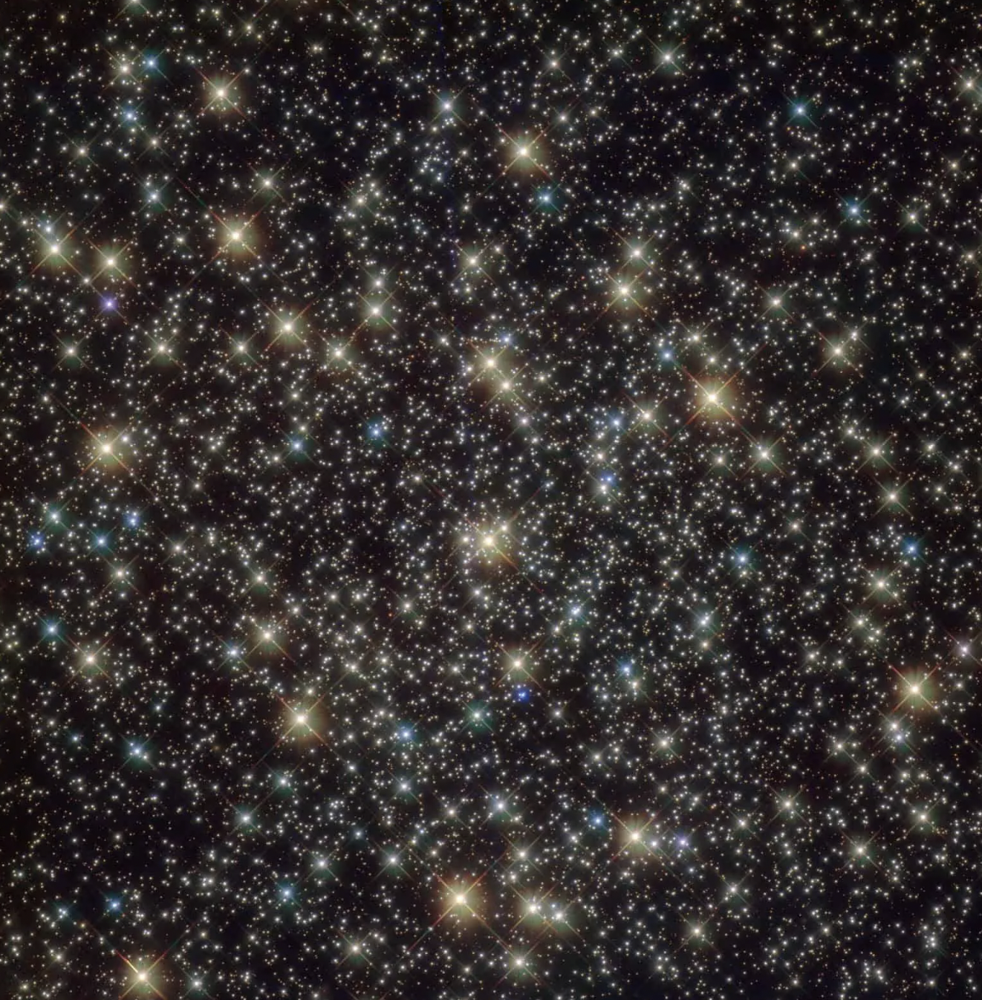

In [23]:
import pandas as pd 
import astropy.units as u
from astropy.table import Table
import matplotlib.pyplot as plt

In [24]:
from astropy.coordinates import SkyCoord

In [25]:
# https://heasarc.gsfc.nasa.gov/W3Browse/all/fermifhl.html
# let's first open the fits file and see what do it have for us
fermi_2 = Table.read('/Users/dhruvkumar/Desktop/fermi_2fhl_catalog.fits',hdu = 1)

In [26]:
fermi_2 # nicely, opened the catalog now let's do our anylasysis

Source_Name,RAJ2000,DEJ2000,GLON,GLAT,Pos_err_68,Pos_err_95,TS,Spectral_Index,Unc_Spectral_Index,Intr_Spectral_Index_D11,Unc_Intr_Spectral_Index_D11,Intr_Spectral_Index_G12,Unc_Intr_Spectral_Index_G12,Flux50,Unc_Flux50,Energy_Flux50,Unc_Energy_Flux50,Flux50_171GeV,Unc_Flux50_171GeV [2],Sqrt_TS50_171GeV,Flux171_585GeV,Unc_Flux171_585GeV [2],Sqrt_TS171_585GeV,Flux585_2000GeV,Unc_Flux585_2000GeV [2],Sqrt_TS585_2000GeV,Npred,HEP_Energy,HEP_Prob,ROI,ASSOC,ASSOC_PROB_BAY,ASSOC_PROB_LR,CLASS,Redshift,NuPeak_obs,3FGL_Name,1FHL_Name,TeVCat_Name
,deg,deg,deg,deg,deg,deg,,,,,,,,ph / (cm2 s),ph / (cm2 s),erg / (cm2 s),erg / (cm2 s),ph / (cm2 s),ph / (cm2 s),,ph / (cm2 s),ph / (cm2 s),,ph / (cm2 s),ph / (cm2 s),,,GeV,,,,,,,,Hz,,,
bytes18,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int16,bytes25,float32,float32,bytes8,float32,float32,bytes18,bytes18,bytes18
2FHL J0008.1+4709,2.044,47.164,115.339,-15.069,0.061,0.098,28.6,6.24,2.75,3.96,3.19,2.16,4.21,1.2300e-11,6.7100e-12,1.2100e-12,6.7100e-13,3.3634e-12,-1.5367e-12 .. 2.1609e-12,5.35,4.3495e-18,-- .. 4.7539e-12,0.00,8.4487e-18,-- .. 7.2910e-12,0.00,4.00,68.15,0.99,1,MG4 J000800+4712,0.9972,0.8348,bll,2.10000,2.5119e+15,3FGL J0008.0+4713,1FHL J0007.7+4709,--
2FHL J0009.3+5031,2.343,50.522,116.124,-11.793,0.045,0.073,54.0,5.08,1.66,--,--,--,--,1.9100e-11,7.8200e-12,2.0300e-12,8.7900e-13,8.3628e-12,-2.9896e-12 .. 3.8951e-12,7.35,2.9146e-17,-- .. 5.1000e-12,0.00,3.5087e-16,-- .. 4.8746e-12,0.00,6.40,72.76,1.00,1,NVSS J000922+503028,0.9997,0.7348,bll,0.00000,1.4125e+15,3FGL J0009.3+5030,1FHL J0009.2+5032,--
2FHL J0018.5+2947,4.635,29.788,114.463,-32.542,0.037,0.060,30.9,2.58,0.99,2.41,1.04,2.40,1.04,1.0600e-11,6.1500e-12,2.0500e-12,1.7200e-12,9.6544e-12,-5.5534e-12 .. 5.5534e-12,5.77,1.1790e-15,-- .. 5.3787e-12,0.00,1.6047e-16,-- .. 6.1201e-12,0.00,3.00,127.32,1.00,3,RBS 0042,0.9999,0.9785,bll,0.10000,5.9156e+16,3FGL J0018.4+2947,1FHL J0018.6+2946,--
2FHL J0022.0+0006,5.500,0.106,107.172,-61.862,0.051,0.082,30.0,1.86,0.57,0.95,0.72,0.88,0.71,1.9700e-11,9.5600e-12,6.8600e-12,5.2900e-12,1.6120e-11,-7.1726e-12 .. 9.9535e-12,5.38,3.6392e-12,-4.3864e-12 .. 4.3864e-12,1.39,8.4236e-16,-- .. 7.3424e-12,0.00,4.80,180.13,0.86,2,5BZGJ0022+0006,0.9993,0.9001,bll-g,0.30600,4.3152e+16,--,--,--
2FHL J0033.6-1921,8.411,-19.358,94.280,-81.222,0.035,0.056,148.3,3.32,0.69,2.56,0.88,2.33,0.92,5.4600e-11,1.5000e-11,7.6200e-12,2.6900e-12,4.0016e-11,-1.0162e-11 .. 1.2238e-11,12.17,2.1390e-12,-- .. 8.2581e-12,0.91,2.4395e-17,-- .. 6.8423e-12,0.00,13.80,170.01,0.99,2,KUV 00311-1938,0.9998,0.9814,bll,0.61000,8.3176e+15,3FGL J0033.6-1921,1FHL J0033.6-1921,TeV J0033-193
2FHL J0035.8+5949,8.962,59.831,120.972,-2.981,0.032,0.051,402.4,2.23,0.21,--,--,--,--,1.2500e-10,1.9000e-11,3.1100e-11,7.2300e-12,9.4229e-11,-1.5257e-11 .. 1.7157e-11,17.31,2.6699e-11,-7.6282e-12 .. 9.4508e-12,10.39,3.7261e-16,-- .. 4.6744e-12,0.00,46.50,247.62,0.96,4,1ES 0033+595,1.0000,0.9929,bll,0.00000,1.3183e+17,3FGL J0035.9+5949,1FHL J0035.9+5950,TeV J0035+598
2FHL J0040.3+4049,10.095,40.832,120.676,-21.992,0.036,0.057,26.8,2.12,0.81,--,--,--,--,1.0500e-11,6.3000e-12,2.8400e-12,2.6700e-12,7.4158e-12,-4.0778e-12 .. 6.4518e-12,4.95,3.0031e-12,-2.3178e-12 .. 4.4664e-12,1.71,4.7317e-16,-- .. 5.7981e-12,0.00,3.20,258.77,0.85,3,B3 0037+405,0.9987,0.9347,bcu I,0.00000,1.0000e+00,3FGL J0040.3+4049,1FHL J0040.3+4049,--
2FHL J0043.9+3424,10.976,34.411,121.164,-28.435,0.059,0.095,39.5,4.57,1.61,3.46,1.85,2.95,1.91,1.8300e-11,8.2400e-12,2.0300e-12,9.9300e-13,9.6576e-12,-4.3169e-12 .. 4.3169e-12,6.31,8.7586e-17,-- .. 5.2433e-12,0.00,9.4381e-16,-- .. 5.6879e-12,0.00,5.40,109.97,0.90,3,GB6 J0043+3426,0.9986,0.8388,fsrq,0.96600,6.4565e+13,3FGL J0043.8+3425,1FHL J0043.7+3425,--


In [27]:
fermi_2['Flux50']

1.2300e-11
1.9100e-11
1.0600e-11
1.9700e-11
5.4600e-11
1.2500e-10
1.0500e-11
1.8300e-11
4.1400e-11
1.2100e-11
2.6900e-11


In [28]:
# sort the brightness Arranging in increasiong order by using sort command
fermi_2.sort('Flux50')

In [29]:
# With -1 we get the last element
print('The brightest source in the catalog is: {} \n'.format(fermi_2[-1]['ASSOC'])) # the brightest source lies at the bottom of table.(sort)
# we have printed the name of the brigestest source as well.

The brightest source in the catalog is: Crab 



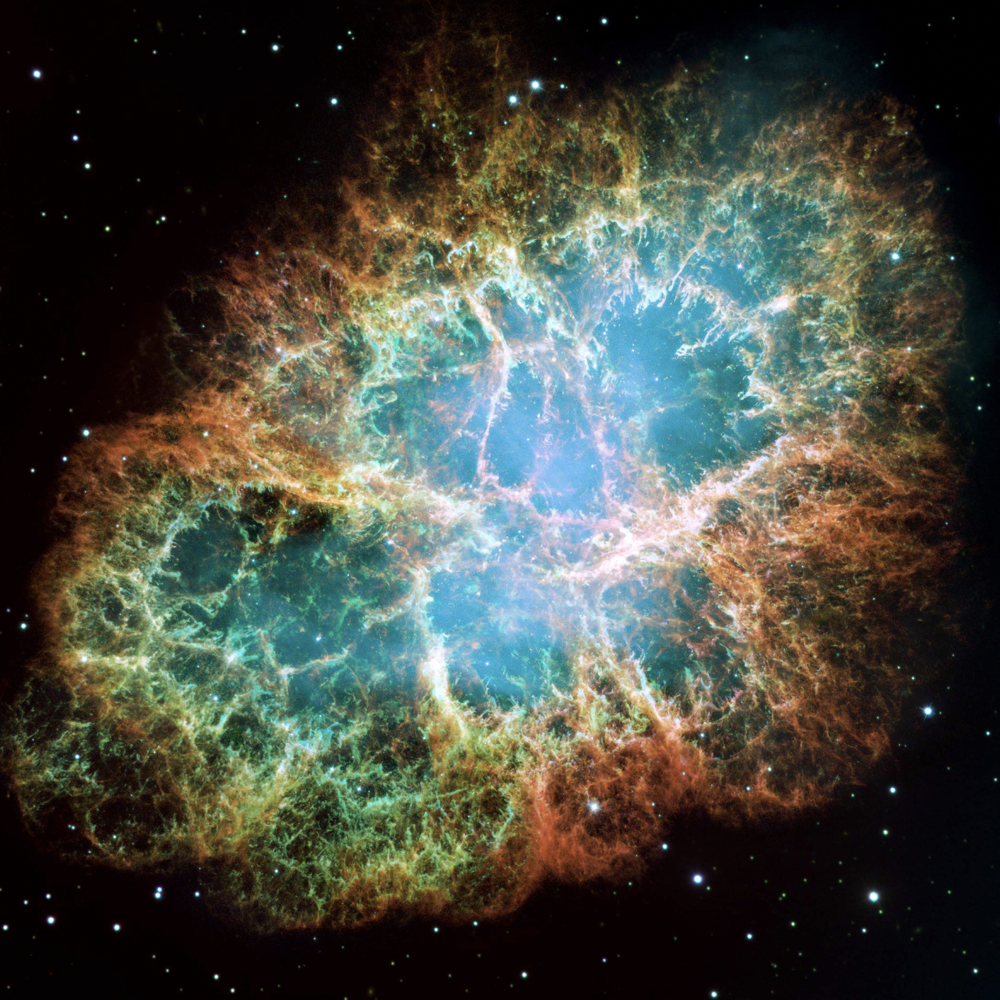

In [30]:
# Defie SkyCoord for all objects in the table
coords = SkyCoord(fermi_2['GLON'], fermi_2['GLAT'], frame='galactic')

In [31]:
coords

<SkyCoord (Galactic): (l, b) in deg
    [(104.24645  ,  3.46941948e+01), (109.8606   ,  3.41873322e+01),
     ( 83.480705 ,  2.96980000e+01), (102.279366 ,  4.53812599e+01),
     (165.63643  ,  1.28411131e+01), (113.42797  ,  6.82591553e+01),
     (292.91138  , -4.56719131e+01), (332.6909   , -3.89547348e+01),
     ( 60.235332 ,  6.36993408e+01), (277.00583  , -4.63038902e+01),
     (111.49615  ,  4.95449181e+01), (110.03849  ,  2.90416298e+01),
     (188.28128  ,  4.19465866e+01), ( 44.07846  ,  2.54034119e+01),
     (160.03992  ,  1.45606613e+01), (273.07666  , -7.94406414e+00),
     (263.7052   , -5.48622398e+01), (332.49066  ,  2.91760254e+01),
     (252.92938  , -5.60638351e+01), (120.676285 , -2.19918118e+01),
     ( 47.816254 , -8.52781773e+00), ( 93.32115  ,  1.97309322e+01),
     (171.43312  ,  1.82136993e+01), (144.52765  , -7.79215479e+00),
     (157.43329  ,  1.80989914e+01), (114.46349  , -3.25423508e+01),
     (240.25273  , -5.43995934e+01), (353.6255   , -2.78671989e+01)

In [32]:
# Get Crab position
# coord_crab # in ICRS frame

In [33]:
SkyCoord.from_name('Crab').transform_to('icrs')

<SkyCoord (ICRS): (ra, dec) in deg
    (83.63311446, 22.01448714)>

In [34]:
# Get Crab position
coord_crab = coords[fermi_2["ASSOC"] == "Crab"]
coord_crab # in galactic frame

<SkyCoord (Galactic): (l, b) in deg
    [(184.55202, -5.7798166)]>

In [35]:
# Find rows where separation < 1 deg
separation = coord_crab.separation(coords) # here we have taken crab as the source

In [36]:
separation

<Angle [ 85.38682  ,  80.75249  , 102.46549  ,  88.72334  ,  26.457216 ,
         88.528305 ,  98.44939  , 126.427376 , 109.804115 ,  87.51345  ,
         83.59758  ,  79.43418  ,  47.84762  , 137.42653  ,  31.69517  ,
         87.74836  ,  79.040695 , 141.7474   ,  73.24838  ,  63.645943 ,
        134.55188  ,  93.10211  ,  27.261366 ,  39.780907 ,  35.861217 ,
         70.13475  ,  65.90476  , 144.7381   ,  46.05379  ,  76.42542  ,
        137.53789  , 138.36258  , 118.523865 ,  62.258923 ,  85.096176 ,
        132.45683  ,  58.333004 ,  54.365013 ,  92.96581  , 125.310165 ,
        132.22905  ,  71.589226 ,  48.807655 , 100.34295  ,  98.43668  ,
         44.377686 ,  43.20902  ,  75.11714  ,  75.96924  , 114.13795  ,
        110.278946 ,  56.438828 ,  83.07406  ,  61.655277 ,  64.63225  ,
        104.39757  ,  68.4609   ,  59.408222 ,  94.952065 ,  49.868908 ,
        110.712715 ,  88.565735 , 112.544716 , 113.6515   , 108.60978  ,
        136.86919  ,  87.7066   ,  17.554567 ,  66.

In [37]:
# Print result
max_separation = 15 * u.deg # we are doing it for 15 degrees 
fermi_2[separation < max_separation]  # got ya bro

Source_Name,RAJ2000,DEJ2000,GLON,GLAT,Pos_err_68,Pos_err_95,TS,Spectral_Index,Unc_Spectral_Index,Intr_Spectral_Index_D11,Unc_Intr_Spectral_Index_D11,Intr_Spectral_Index_G12,Unc_Intr_Spectral_Index_G12,Flux50,Unc_Flux50,Energy_Flux50,Unc_Energy_Flux50,Flux50_171GeV,Unc_Flux50_171GeV [2],Sqrt_TS50_171GeV,Flux171_585GeV,Unc_Flux171_585GeV [2],Sqrt_TS171_585GeV,Flux585_2000GeV,Unc_Flux585_2000GeV [2],Sqrt_TS585_2000GeV,Npred,HEP_Energy,HEP_Prob,ROI,ASSOC,ASSOC_PROB_BAY,ASSOC_PROB_LR,CLASS,Redshift,NuPeak_obs,3FGL_Name,1FHL_Name,TeVCat_Name
,deg,deg,deg,deg,deg,deg,,,,,,,,ph / (cm2 s),ph / (cm2 s),erg / (cm2 s),erg / (cm2 s),ph / (cm2 s),ph / (cm2 s),,ph / (cm2 s),ph / (cm2 s),,ph / (cm2 s),ph / (cm2 s),,,GeV,,,,,,,,Hz,,,
bytes18,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int16,bytes25,float32,float32,bytes8,float32,float32,bytes18,bytes18,bytes18
2FHL J0620.6+2644,95.175,26.746,185.724,5.677,0.040,0.065,36.1,1.53,0.54,--,--,--,--,1.4700e-11,7.3900e-12,7.1900e-12,5.5400e-12,7.7541e-12,-4.2980e-12 .. 6.8661e-12,4.11,7.1652e-12,-3.9503e-12 .. 6.4132e-12,4.60,1.5758e-15,-- .. 6.1415e-12,0.00,4.20,448.65,1.00,23,RX J0620.6+2644,--,0.9804,bcu II,0.00000,1.2162e+16,3FGL J0620.4+2644,,
2FHL J0534.1+2753,83.525,27.886,179.544,-2.704,0.049,0.079,29.1,3.18,1.10,--,--,--,--,1.6400e-11,8.0200e-12,2.4000e-12,1.4400e-12,1.2975e-11,-5.3815e-12 .. 7.3262e-12,5.44,5.1763e-16,-- .. 6.2549e-12,0.00,1.8205e-16,-- .. 5.8903e-12,0.00,4.90,135.43,0.99,17,S147,--,0.8939,snr,0.00000,--,3FGL J0540.3+2756e,,
2FHL J0515.5+1530,78.888,15.503,187.622,-13.094,0.065,0.104,42.0,6.41,2.27,--,--,--,--,2.4200e-11,9.7300e-12,2.3800e-12,9.8500e-13,6.1487e-12,-2.1737e-12 .. 2.8043e-12,6.49,4.5839e-13,-- .. 7.6937e-12,0.61,1.0190e-17,-- .. 6.7986e-12,0.00,6.80,68.77,0.99,17,NVSS J051547+152716,0.9940,--,bll,--,6.6681e+13,3FGL J0515.8+1526,1FHL J0515.9+1528,
2FHL J0600.2+1243,90.064,12.732,195.720,-5.265,0.041,0.066,37.3,2.30,0.60,--,--,--,--,2.7100e-11,1.1300e-11,6.3500e-12,3.8400e-12,2.1717e-11,-8.6426e-12 .. 1.1363e-11,5.43,4.2992e-12,-3.0118e-12 .. 5.7291e-12,2.90,3.1833e-16,-- .. 6.4856e-12,0.00,7.40,237.89,0.99,141,1RXS J060014.8+124341,--,0.9833,bcu III,0.00000,--,,,
2FHL J0521.7+2112,80.438,21.209,183.607,-8.714,0.031,0.050,562.6,2.92,0.27,2.78,0.28,2.76,0.28,2.0400e-10,2.7500e-11,3.2900e-11,5.8600e-12,1.6515e-10,-2.1797e-11 .. 2.3864e-11,23.20,8.3150e-12,-4.2235e-12 .. 6.1628e-12,5.35,7.5567e-17,-- .. 5.9877e-12,0.00,58.90,316.79,0.86,17,TXS 0518+211,1.0000,0.9867,bll,0.10800,2.1627e+14,3FGL J0521.7+2113,1FHL J0521.7+2113,TeV J0521+211
2FHL J0617.2+2234e,94.310,22.580,189.048,3.033,0.000,0.000,398.6,2.66,0.21,--,--,--,--,2.7000e-10,3.2100e-11,4.9700e-11,8.3900e-12,2.1090e-10,-2.5807e-11 .. 2.7968e-11,18.80,2.4934e-11,-8.2973e-12 .. 1.0530e-11,6.62,7.1373e-12,-3.9838e-12 .. 6.3763e-12,3.70,78.20,699.50,0.98,23,IC 443,--,--,snr,--,--,3FGL J0617.2+2234e,1FHL J0617.2+2234e,TeV J0616+225
2FHL J0534.5+2201,83.634,22.021,184.552,-5.780,0.030,0.049,5149.7,2.13,0.07,--,--,--,--,1.3100e-09,6.8300e-11,3.5200e-10,2.9000e-11,9.9407e-10,-5.7595e-11 .. 5.9473e-11,63.58,2.4388e-10,-2.8254e-11 .. 3.0435e-11,33.18,5.2754e-11,-1.3340e-11 .. 1.6048e-11,14.46,377.70,1463.30,1.00,19,Crab,0.9983,0.9969,pwn,--,--,3FGL J0534.5+2201i,1FHL J0534.5+2201,TeV J0534+220p


In [38]:
max_separation

<Quantity 15. deg>